Sampling rate: 500 Hz

i.e. 20 timepoints between two timestamps which are 0.04 sec apart

i.e. two consecutive timepoints are on average 0.002 sec apart

In [145]:
from datetime import datetime, date
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy

In [2]:
ls FishTaskPilotData/Data/subj07

SUBJ07_Right.csv*
test__Control_Data__.json*
test__Device_Data_Digitimer_DS5_NI_USB_6202__.json*
test__Device_Data_LiveAmp_LSL_Compatible_Univ__.json*
test__Device_Data_Unity_C_Sharp_Client_VR__.json*
test__Device_Descriptors__.json*


In [138]:
subj_range = [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32]

In [139]:
def subtract_timestamps(end_timestamp, start_timestamp):
    return datetime.combine(end_timestamp.date(), end_timestamp.time()) - datetime.combine(start_timestamp.date(), start_timestamp.time())


In [150]:
for subj_num in subj_range:
    print(subj_num)
    subj_str = str(subj_num).zfill(2)
    js1 = pd.read_json('FishTaskPilotData/Data/subj'+subj_str+'/test__Device_Data_LiveAmp_LSL_Compatible_Univ__.json')
    js2 = pd.read_json('FishTaskPilotData/Data/subj'+subj_str+'/test__Device_Data_Unity_C_Sharp_Client_VR__.json')
    try:
        behavioural_df = pd.read_csv('FishTaskPilotData/Data/subj'+subj_str+'/SUBJ'+subj_str+'_Right.csv')
    except:
        behavioural_df = pd.read_csv('FishTaskPilotData/Data/subj'+subj_str+'/SUBJ'+subj_str+'_Left.csv')
    full_seq_df = pd.read_csv('full_seq.csv')
    behavioural_df = behavioural_df.join(full_seq_df)
    
    mapping = {'approach': 'approach', 'withdrawal': 'withdrawal', 'inactive_approach': 'approach', 'inactive_withdrawal': 'withdrawal'}
    behavioural_df['Action'] = behavioural_df['Action'].replace(mapping)
    behavioural_df['Trial'] = behavioural_df['Trial'] -1
    
    for ind in range(len(js2)):
        if js2['trialnum'].iloc[ind]==1:
            start_ind = ind
            break
    start_ind = max(0, start_ind - 200)
    start_timestamp = js2[start_ind:]['timestamp'][start_ind]
    
    trial_start_indices = []
    trial_start_times = []
    fixation_indices = []
    fixation_times = []
    stimuli_indices = []
    stimuli_times = []
    feedback_indices =[]
    feedback_times = []
    exit_indices = []
    exit_times = []

    trialphaseval = 'nothing'
    trial = 1
    for ind in range(len(js2)):
        if (js2['trialphase'][ind]!=trialphaseval):
            trialphaseval = js2['trialphase'][ind]
            if (js2['trialphase'][ind] == "fixation"):
                fixation_indices.append(ind)
                fixation_times.append(subtract_timestamps(js2['timestamp'][ind], start_timestamp))
            if (js2['trialphase'][ind] == "stimuli"):
                stimuli_indices.append(ind)
                stimuli_times.append(subtract_timestamps(js2['timestamp'][ind], start_timestamp))
            if (js2['trialphase'][ind] == "feedback"):
                feedback_indices.append(ind)
                feedback_times.append(subtract_timestamps(js2['timestamp'][ind], start_timestamp))
            if (js2['trialphase'][ind] == "exit"):
                exit_indices.append(ind)
                exit_times.append(subtract_timestamps(js2['timestamp'][ind], start_timestamp))           

        if js2['trialnum'].iloc[ind]==trial:
            trial_start_indices.append(ind)
            trial_start_times.append(subtract_timestamps(js2['timestamp'][ind], start_timestamp))

            trial +=1

            
    cue1_incorrect_trials = np.array(behavioural_df_modified.loc[behavioural_df_modified['cue1'] == 1.0].loc[behavioural_df_modified['Action']=='withdrawal']['Trial'])
    cue2_incorrect_trials = np.array(behavioural_df_modified.loc[behavioural_df_modified['cue2'] == 1.0].loc[behavioural_df_modified['Action']=='approach']['Trial'])

    cue3_incorrect_trials = np.array(behavioural_df_modified.loc[behavioural_df_modified['cue3'] == 1.0].loc[behavioural_df_modified['Action']=='withdrawal']['Trial'])
    cue4_incorrect_trials = np.array(behavioural_df_modified.loc[behavioural_df_modified['cue4'] == 1.0].loc[behavioural_df_modified['Action']=='approach']['Trial'])

    cue3_incorrect_trials = cue3_incorrect_trials[cue3_incorrect_trials>120]
    cue4_incorrect_trials = cue4_incorrect_trials[cue4_incorrect_trials>120]
    
    
    events_df = pd.DataFrame(columns = ['latency', 'type', 'trial', 'action', 'phase_approach_withdrawal',  'cue12', 'cue12_incorrect', 'controllable_cue_firsthalf', 'controllable_cue_all'])
    for i in range(240):
        action = behavioural_df['Action'][i]

        if behavioural_df['cue1'][i] == 1:
            cue12 = 'cue1'
        elif behavioural_df['cue2'][i] == 1:
            cue12 = 'cue2'
        else:
            cue12 = 'neither'

        if (i+1) in cue1_incorrect_trials or (i+1) in cue2_incorrect_trials:
            cue12_incorrect = 'cue12_incorrect_response'
        elif behavioural_df['cue1'][i] == 1 or behavioural_df['cue2'][i] == 1:
            cue12_incorrect = 'cue12_correct_response'
        else:
            cue12_incorrect = 'cue34'

        if i<120:
            if behavioural_df['cue1'][i] == 1 or behavioural_df['cue2'][i] == 1:
                controllable_cue_firsthalf = 'controllable_cue_firsthalf'
                controllable_cue_all = 'controllable_cue_all'
            else:
                controllable_cue_firsthalf = 'uncontrollable_cue_firsthalf'
                controllable_cue_all = 'uncontrollable_cue_all'

        else:
            controllable_cue_firsthalf = 'neither'
            controllable_cue_all = 'controllable_cue_all'


        events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
        events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
        events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
        events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
        
    events_df.to_csv(r'EEGraw/EEGeventsall/events_subj'+subj_str+'.txt', index=None, sep='\t')
    events_df[events_df['cue12'] == 'cue1'][['latency', 'type']].to_csv(r'EEGraw/EEGevents1/events_subj'+subj_str+'_cue1_response.txt', index=None, sep='\t')
    events_df[events_df['cue12'] == 'cue2'][['latency', 'type']].to_csv(r'EEGraw/EEGevents1/events_subj'+subj_str+'_cue2_response.txt', index=None, sep='\t')
    events_df[events_df['cue12_incorrect'] == 'cue12_incorrect_response'][['latency', 'type']].to_csv(r'EEGraw/EEGevents2/events_subj'+subj_str+'_cue12_incorrect_response.txt', index=None, sep='\t')
    events_df[events_df['cue12_incorrect'] == 'cue12_correct_response'][['latency', 'type']].to_csv(r'EEGraw/EEGevents2/events_subj'+subj_str+'_cue12_correct_response.txt', index=None, sep='\t')
    events_df[events_df['phase_approach_withdrawal'] == 'stimuli_approach'][['latency', 'type']].to_csv(r'EEGraw/EEGevents3/events_subj'+subj_str+'_approach_response.txt', index=None, sep='\t')
    events_df[events_df['phase_approach_withdrawal'] == 'stimuli_withdrawal'][['latency', 'type']].to_csv(r'EEGraw/EEGevents3/events_subj'+subj_str+'_withdrawal_response.txt', index=None, sep='\t')
    events_df[events_df['controllable_cue_firsthalf'] == 'controllable_cue_firsthalf'][['latency', 'type']].to_csv(r'EEGraw/EEGevents4/events_subj'+subj_str+'_controllable_cue_firsthalf_response.txt', index=None, sep='\t')
    events_df[events_df['controllable_cue_firsthalf'] == 'uncontrollable_cue_firsthalf'][['latency', 'type']].to_csv(r'EEGraw/EEGevents4/events_subj'+subj_str+'_uncontrollable_cue_firsthalf_response.txt', index=None, sep='\t')
        
    print("events done")
    for i in range(len(js1)):
        if start_timestamp >= js1['timestamp'][i] and start_timestamp < js1['timestamp'][i+1]:
            print(i, js1['timestamp'][i] , js1['timestamp'][i+1])
            js1_start_ind = i
    
    percent_frame_start = subtract_timestamps(start_timestamp, js1['timestamp'][js1_start_ind]) / subtract_timestamps(js1['timestamp'][js1_start_ind+1], js1['timestamp'][js1_start_ind])
    start_index_within_frame = np.int32(np.round(percent_frame_start * 20)) - 1
    js1_trimmed = js1[js1_start_ind + start_index_within_frame:]
    
    flattened_channel = np.array(js1_trimmed['Ch1'].explode())
    len_flattened = len(flattened_channel)

    flattened_channels = np.zeros((32, len_flattened))
    for i in range(32):
        flattened_channels[i] = np.array(js1_trimmed['Ch'+str(i+1)].explode())
    
#     scipy.io.savemat('eeg_subj'+subj_str+'.mat', {'eegdata': flattened_channels})
    subset_electrodes = np.array([2, 7, 29, 8, 24, 25, 9, 26, 12, 23, 13, 10, 21]) -1
    scipy.io.savemat('EEGraw/EEGraw/eeg_subj'+subj_str+'_subset.mat', {'eegdata': flattened_channels[subset_electrodes, :]})
    del js1
    del js2

3


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

events done
22408 2022-08-31 13:18:31.372000 2022-08-31 13:18:31.403000
4


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

events done
25785 2022-08-31 16:41:12.931000 2022-08-31 16:41:12.971000
5


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

events done
22405 2022-09-01 12:14:45.264000 2022-09-01 12:14:45.320000
6


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

events done
21076 2022-09-02 10:18:23.324000 2022-09-02 10:18:23.407000
7


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

events done
25666 2022-09-06 15:14:36.419000 2022-09-06 15:14:36.457000
8


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

events done
18191 2022-09-07 15:24:46.842000 2022-09-07 15:24:46.877000
9


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

events done
19173 2022-09-12 10:36:20.991000 2022-09-12 10:36:21.061000
10


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

events done
19441 2022-09-13 14:19:29.248000 2022-09-13 14:19:29.312000
11


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

events done
20355 2022-09-16 12:16:43.364000 2022-09-16 12:16:43.446000
12


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

events done
18052 2022-09-19 14:32:13.094000 2022-09-19 14:32:13.130000
13


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

events done
12381 2022-09-22 16:35:04.419000 2022-09-22 16:35:04.498000
14


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

events done
22271 2022-09-24 14:46:29.717000 2022-09-24 14:46:29.765000
15


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

events done
11648 2022-09-26 15:26:52.874000 2022-09-26 15:26:52.912000
16


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

events done
29697 2022-09-28 15:41:53.410000 2022-09-28 15:41:53.456000
17


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

events done
907 2022-10-18 10:57:34.933000 2022-10-18 10:57:35.089000
18


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

events done
11667 2022-10-18 14:44:38.816000 2022-10-18 14:44:38.967000
19


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

events done
2198 2022-10-19 13:51:05.076000 2022-10-19 13:51:05.156000
21


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

events done
15257 2022-10-25 10:59:02.894000 2022-10-25 10:59:02.924000
23


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

events done
8782 2022-10-27 15:06:01.623000 2022-10-27 15:06:02.125000
24


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

events done
13332 2022-10-29 15:06:35.919000 2022-10-29 15:06:35.966000
25


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

events done
14568 2022-10-30 17:18:12.775000 2022-10-30 17:18:12.815000
26


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)


events done
13711 2022-11-01 12:01:51.053000 2022-11-01 12:01:51.108000
27


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

events done
11933 2022-11-01 15:54:29.755000 2022-11-01 15:54:29.805000
28


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

events done
11518 2022-11-02 10:50:16.449000 2022-11-02 10:50:16.501000
29


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

events done
14424 2022-11-03 10:59:56.035000 2022-11-03 10:59:56.098000
30


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

events done
13407 2022-11-04 17:07:45.769000 2022-11-04 17:07:45.813000
31


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

events done
19122 2022-11-16 18:21:05.830000 2022-11-16 18:21:05.892000
32


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_fi

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:103: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:102: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorr

/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:104: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/2642862932.py:101: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllab

events done
14587 2022-11-22 16:17:54.830000 2022-11-22 16:17:54.928000


In [33]:
# for subj_num in subj_range:
subj_num=7
print(subj_num)
subj_str = str(subj_num).zfill(2)
js1 = pd.read_json('FishTaskPilotData/Data/subj'+subj_str+'/test__Device_Data_LiveAmp_LSL_Compatible_Univ__.json')
js2 = pd.read_json('FishTaskPilotData/Data/subj'+subj_str+'/test__Device_Data_Unity_C_Sharp_Client_VR__.json')
try:
    behavioural_df = pd.read_csv('FishTaskPilotData/Data/subj'+subj_str+'/SUBJ'+subj_str+'_Right.csv')
except:
    behavioural_df = pd.read_csv('FishTaskPilotData/Data/subj'+subj_str+'/SUBJ'+subj_str+'_Left.csv')
full_seq_df = pd.read_csv('full_seq.csv')
behavioural_df = behavioural_df.join(full_seq_df)

7


In [108]:
com_approach_to_withdrawal = np.load('SUBJ07_com_approach_to_withdrawal.npy')
com_withdrawal_to_approach = np.load('SUBJ07_com_withdrawal_to_approach.npy')

In [70]:
mapping = {'approach': 'approach', 'withdrawal': 'withdrawal', 'inactive_approach': 'approach', 'inactive_withdrawal': 'withdrawal'}
behavioural_df['Action'] = behavioural_df['Action'].replace(mapping)
behavioural_df['Trial'] = behavioural_df['Trial'] -1
behavioural_df

,Trial,Action,ReactionTime,TrialStartTime,TrialEndTime,ShockGiven,cue1,cue2,cue3,cue4,resultGo,resultNoGo
0,1,approach,0.344539,11.41381,15.53396,False,0.0,0.0,1.0,0.0,0.0,1.0
1,2,approach,1.177110,16.11169,21.06484,False,0.0,0.0,0.0,1.0,0.0,1.0
2,3,approach,0.943997,21.38680,26.10712,True,0.0,0.0,0.0,1.0,1.0,0.0
3,4,withdrawal,1.976938,29.33892,35.09180,False,0.0,1.0,0.0,0.0,1.0,0.0
4,5,approach,0.988257,38.92362,43.68789,False,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
235,236,withdrawal,0.722147,1282.11300,1286.61200,False,0.0,1.0,0.0,0.0,1.0,0.0
236,237,approach,1.255071,1287.64400,1292.67600,False,1.0,0.0,0.0,0.0,0.0,1.0
237,238,withdrawal,0.755152,1292.84200,1297.37500,False,0.0,1.0,0.0,0.0,1.0,0.0
238,239,withdrawal,0.832746,1298.16300,1302.77100,False,0.0,0.0,0.0,1.0,1.0,0.0


JS2 has trial phases and whether it ended in withdrawal or approach

JS1 has EEG data

# Constructing events_df from JS2 and other preliminary analysis dfs

In [5]:
for ind in range(len(js2)):
    if js2['trialnum'].iloc[ind]==1:
        start_ind = ind
        break
        
start_ind = max(0, start_ind - 200)
print(start_ind)

55958


In [5]:
js2[start_ind:]

,left_hand_position,left_hand_rotation,right_hand_position,right_hand_rotation,head_position,head_rotation,left_elbow_position,left_elbow_rotation,right_elbow_position,right_elbow_rotation,...,currentscene,trialnum,action,reactiontime,trialstarttime,trialendtime,trialphase,fruits_position,fruits_name,timestamp
55958,"[1.155533909797668, -0.41040080785751304, 11.8...","[0.22563117742538402, 0.013058100827038, 0.960...","[2.280002355575561, -0.16763456165790502, 13.9...","[0.16384504735469801, -0.27292051911354004, 0....","[2.5, 0, 14]","[-0.09194093197584101, -0.008401310071349, 0.9...","[2.5, 0, 14]","[1, 0, 0, 0]","[1.017044901847839, 1.045427322387695, 13.9348...","[0.9386827349662781, 0.028868274763226003, -0....",...,mainexperiment,-1,,-1.0000,-1.000000,-1.000000,exitLimbo,[],[],2022-09-06 15:14:36.451
55959,"[1.155533909797668, -0.41040080785751304, 11.8...","[0.22563117742538402, 0.013058100827038, 0.960...","[2.2800533771514893, -0.167016923427581, 13.92...","[0.163648128509521, -0.273008912801742, 0.7129...","[2.5, 0, 14]","[-0.09207858145236901, -0.008312899619340001, ...","[2.5, 0, 14]","[1, 0, 0, 0]","[1.017048835754394, 1.04544198513031, 13.93485...","[0.938708245754241, 0.028934527188539002, -0.2...",...,mainexperiment,-1,,-1.0000,-1.000000,-1.000000,exitLimbo,[],[],2022-09-06 15:14:36.462
55960,"[1.155533909797668, -0.41040080785751304, 11.8...","[0.22563117742538402, 0.013058100827038, 0.960...","[2.2801513671875, -0.166456669569015, 13.92823...","[0.163689166307449, -0.27312579751014704, 0.71...","[2.5, 0, 14]","[-0.092385575175285, -0.008391080424189, 0.994...","[2.5, 0, 14]","[1, 0, 0, 0]","[1.017051219940185, 1.045437097549438, 13.9350...","[0.9387770891189571, 0.029050683602690003, -0....",...,mainexperiment,-1,,-1.0000,-1.000000,-1.000000,exitLimbo,[],[],2022-09-06 15:14:36.473
55961,"[1.155533909797668, -0.41040080785751304, 11.8...","[0.22563117742538402, 0.013058100827038, 0.960...","[2.280225753784179, -0.16587562859058302, 13.9...","[0.163826033473014, -0.273139417171478, 0.7132...","[2.5, 0, 14]","[-0.09253225475549601, -0.008385330438613, 0.9...","[2.5, 0, 14]","[1, 0, 0, 0]","[1.017159700393676, 1.0453435182571411, 13.935...","[0.9387933015823361, 0.029202116653323004, -0....",...,mainexperiment,-1,,-1.0000,-1.000000,-1.000000,exitLimbo,[],[],2022-09-06 15:14:36.485
55962,"[1.155533909797668, -0.41040080785751304, 11.8...","[0.22563117742538402, 0.013058100827038, 0.960...","[2.280282258987426, -0.165394663810729, 13.929...","[0.16373670101165702, -0.27277484536170904, 0....","[2.5, 0, 14]","[-0.09287440031766801, -0.008264826610684001, ...","[2.5, 0, 14]","[1, 0, 0, 0]","[1.01717460155487, 1.045341849327087, 13.93517...","[0.9387551546096801, 0.029104748740792004, -0....",...,mainexperiment,-1,,-1.0000,-1.000000,-1.000000,exitLimbo,[],[],2022-09-06 15:14:36.496
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175581,"[1.155533909797668, -0.41040080785751304, 11.8...","[0.22563117742538402, 0.013058100827038, 0.960...","[2.054743289947509, -0.175725668668746, 13.940...","[0.635527849197387, -0.084277637302875, -0.764...","[2.5, 0, 14]","[-0.012633939273655002, -0.17977353930473303, ...","[2.5, 0, 14]","[1, 0, 0, 0]","[0.9949896335601801, 1.034755229949951, 13.732...","[0.8508306741714471, 0.17175228893756803, -0.4...",...,mainexperiment,240,withdrawal,0.6776,1303.137817,1307.590942,break,[],[],2022-09-06 15:36:46.442
175582,"[1.155533909797668, -0.41040080785751304, 11.8...","[0.22563117742538402, 0.013058100827038, 0.960...","[2.054524660110473, -0.175527766346931, 13.940...","[0.6355317831039421, -0.084250018000602, -0.76...","[2.5, 0, 14]","[-0.012703635729849, -0.17977572977542802, -0....","[2.5, 0, 14]","[1, 0, 0, 0]","[0.9950097799301141, 1.034908652305603, 13.732...","[0.85042655467987, 0.171526730060577, -0.46467...",...,mainexperiment,240,withdrawal,0.6776,1303.137817,1307.590942,break,[],[],2022-09-06 15:36:46.453
175583,"[1.155533909797668, -0.41040

In [10]:
start_timestamp = js2[start_ind:]['timestamp'][start_ind]

In [11]:
start_timestamp

Timestamp('2022-09-06 15:14:36.451000')

In [23]:
# datetime.combine(end_timestamp.date(), end_timestamp.time()) - datetime.combine(start_timestamp.date(), start_timestamp.time())

In [24]:
# end_timestamp.time() > start_timestamp.time()

In [12]:
def subtract_timestamps(end_timestamp, start_timestamp):
    return datetime.combine(end_timestamp.date(), end_timestamp.time()) - datetime.combine(start_timestamp.date(), start_timestamp.time())


In [13]:
subtract_timestamps(js2['timestamp'][ind], start_timestamp)

datetime.timedelta(seconds=2, microseconds=221000)

In [14]:
trial_start_indices = []
trial_start_times = []
fixation_indices = []
fixation_times = []
stimuli_indices = []
stimuli_times = []
feedback_indices =[]
feedback_times = []
exit_indices = []
exit_times = []


trialphaseval = 'nothing'
trial = 1
for ind in range(len(js2)):
    if (js2['trialphase'][ind]!=trialphaseval):
        trialphaseval = js2['trialphase'][ind]
        if (js2['trialphase'][ind] == "fixation"):
            fixation_indices.append(ind)
            fixation_times.append(subtract_timestamps(js2['timestamp'][ind], start_timestamp))
        if (js2['trialphase'][ind] == "stimuli"):
            stimuli_indices.append(ind)
            stimuli_times.append(subtract_timestamps(js2['timestamp'][ind], start_timestamp))
        if (js2['trialphase'][ind] == "feedback"):
            feedback_indices.append(ind)
            feedback_times.append(subtract_timestamps(js2['timestamp'][ind], start_timestamp))
        if (js2['trialphase'][ind] == "exit"):
            exit_indices.append(ind)
            exit_times.append(subtract_timestamps(js2['timestamp'][ind], start_timestamp))           
            
    if js2['trialnum'].iloc[ind]==trial:
        trial_start_indices.append(ind)
        trial_start_times.append(subtract_timestamps(js2['timestamp'][ind], start_timestamp))
        
        trial +=1


In [11]:
len(trial_start_times)

240

In [19]:
stimuli_times

[datetime.timedelta(seconds=3, microseconds=743000),
 datetime.timedelta(seconds=8, microseconds=441000),
 datetime.timedelta(seconds=13, microseconds=716000),
 datetime.timedelta(seconds=21, microseconds=668000),
 datetime.timedelta(seconds=31, microseconds=253000),
 datetime.timedelta(seconds=36, microseconds=217000),
 datetime.timedelta(seconds=42, microseconds=803000),
 datetime.timedelta(seconds=48, microseconds=368000),
 datetime.timedelta(seconds=54, microseconds=887000),
 datetime.timedelta(seconds=61, microseconds=362000),
 datetime.timedelta(seconds=70, microseconds=224000),
 datetime.timedelta(seconds=75, microseconds=656000),
 datetime.timedelta(seconds=81, microseconds=897000),
 datetime.timedelta(seconds=87, microseconds=572000),
 datetime.timedelta(seconds=93, microseconds=715000),
 datetime.timedelta(seconds=98, microseconds=834000),
 datetime.timedelta(seconds=104, microseconds=21000),
 datetime.timedelta(seconds=110, microseconds=229000),
 datetime.timedelta(seconds=1

In [16]:
len(fixation_times), len(stimuli_times), len(exit_times)

(240, 240, 240)

In [20]:
stimuli_indices

[56295,
 56718,
 57193,
 57909,
 58772,
 59219,
 59812,
 60313,
 60900,
 61483,
 62281,
 62770,
 63332,
 63843,
 64396,
 64857,
 65324,
 65883,
 66358,
 66876,
 67393,
 67887,
 68476,
 68982,
 69435,
 69955,
 70462,
 71001,
 71486,
 71921,
 72361,
 72836,
 73275,
 73721,
 74384,
 74847,
 75455,
 75915,
 76371,
 76967,
 77502,
 77958,
 78412,
 78839,
 79325,
 79753,
 80464,
 80889,
 81303,
 81816,
 82297,
 82701,
 83176,
 83613,
 84195,
 84623,
 85094,
 85583,
 86047,
 86699,
 88267,
 88728,
 89258,
 89906,
 90370,
 91081,
 91526,
 91977,
 92481,
 92923,
 93379,
 93835,
 94381,
 94847,
 95279,
 95733,
 96212,
 96669,
 97118,
 97555,
 97986,
 98438,
 98921,
 99363,
 99803,
 100239,
 100780,
 101250,
 101705,
 102258,
 102737,
 103145,
 103571,
 104018,
 104463,
 104954,
 105381,
 105814,
 106351,
 106761,
 107161,
 107593,
 108056,
 108545,
 108990,
 109434,
 109885,
 110375,
 110808,
 111242,
 111837,
 112274,
 112701,
 113119,
 113578,
 114031,
 114445,
 114861,
 115519,
 115991,
 1173

In [18]:
trial_start_indices

[56158,
 56581,
 57056,
 57772,
 58635,
 59082,
 59675,
 60176,
 60763,
 61346,
 62144,
 62633,
 63195,
 63706,
 64259,
 64720,
 65187,
 65746,
 66221,
 66739,
 67256,
 67750,
 68339,
 68845,
 69298,
 69818,
 70325,
 70864,
 71349,
 71784,
 72224,
 72699,
 73138,
 73584,
 74247,
 74710,
 75318,
 75778,
 76234,
 76830,
 77365,
 77821,
 78275,
 78702,
 79188,
 79616,
 80327,
 80752,
 81166,
 81679,
 82160,
 82604,
 83039,
 83476,
 84058,
 84486,
 84957,
 85446,
 85910,
 86562,
 88130,
 88591,
 89121,
 89769,
 90233,
 90944,
 91389,
 91840,
 92344,
 92786,
 93242,
 93698,
 94244,
 94710,
 95142,
 95596,
 96075,
 96532,
 96981,
 97418,
 97849,
 98301,
 98784,
 99226,
 99666,
 100102,
 100643,
 101113,
 101568,
 102121,
 102600,
 103008,
 103434,
 103881,
 104326,
 104817,
 105244,
 105677,
 106214,
 106624,
 107024,
 107456,
 107919,
 108408,
 108853,
 109297,
 109748,
 110238,
 110671,
 111105,
 111700,
 112137,
 112564,
 112982,
 113441,
 113894,
 114308,
 114724,
 115382,
 115854,
 1172

In [71]:
behavioural_df_modified = behavioural_df

In [103]:
behavioural_df_modified

,Trial,Action,ReactionTime,TrialStartTime,TrialEndTime,ShockGiven,cue1,cue2,cue3,cue4,resultGo,resultNoGo
0,1,approach,0.344539,11.41381,15.53396,False,0.0,0.0,1.0,0.0,0.0,1.0
1,2,approach,1.177110,16.11169,21.06484,False,0.0,0.0,0.0,1.0,0.0,1.0
2,3,approach,0.943997,21.38680,26.10712,True,0.0,0.0,0.0,1.0,1.0,0.0
3,4,withdrawal,1.976938,29.33892,35.09180,False,0.0,1.0,0.0,0.0,1.0,0.0
4,5,approach,0.988257,38.92362,43.68789,False,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
235,236,withdrawal,0.722147,1282.11300,1286.61200,False,0.0,1.0,0.0,0.0,1.0,0.0
236,237,approach,1.255071,1287.64400,1292.67600,False,1.0,0.0,0.0,0.0,0.0,1.0
237,238,withdrawal,0.755152,1292.84200,1297.37500,False,0.0,1.0,0.0,0.0,1.0,0.0
238,239,withdrawal,0.832746,1298.16300,1302.77100,False,0.0,0.0,0.0,1.0,1.0,0.0


In [96]:
cue1_incorrect_trials = np.array(behavioural_df_modified.loc[behavioural_df_modified['cue1'] == 1.0].loc[behavioural_df_modified['Action']=='withdrawal']['Trial'])
cue2_incorrect_trials = np.array(behavioural_df_modified.loc[behavioural_df_modified['cue2'] == 1.0].loc[behavioural_df_modified['Action']=='approach']['Trial'])

cue3_incorrect_trials = np.array(behavioural_df_modified.loc[behavioural_df_modified['cue3'] == 1.0].loc[behavioural_df_modified['Action']=='withdrawal']['Trial'])
cue4_incorrect_trials = np.array(behavioural_df_modified.loc[behavioural_df_modified['cue4'] == 1.0].loc[behavioural_df_modified['Action']=='approach']['Trial'])

cue3_incorrect_trials = cue3_incorrect_trials[cue3_incorrect_trials>120]
cue4_incorrect_trials = cue4_incorrect_trials[cue4_incorrect_trials>120]

In [109]:
com_approach_to_withdrawal

array([  8,  28,  54, 181, 186])

In [110]:
com_withdrawal_to_approach

array([138, 184])

In [132]:
events_df = pd.DataFrame(columns = ['latency', 'type', 'trial', 'action', 'phase_approach_withdrawal',  'cue12', 'cue12_incorrect', 'controllable_cue_firsthalf', 'controllable_cue_all', 'com_all', 'com_specific'])
for i in range(240):
    print(i)
#     events_df = events_df.append({'latency' : trial_start_times[i].total_seconds(), 'type' : 'trial_'+str(i+1)}, ignore_index = True)
    
    action = behavioural_df['Action'][i]
    
    if behavioural_df['cue1'][i] == 1:
        cue12 = 'cue1'
    elif behavioural_df['cue2'][i] == 1:
        cue12 = 'cue2'
    else:
        cue12 = 'neither'
    
    if (i+1) in cue1_incorrect_trials or (i+1) in cue2_incorrect_trials:
        cue12_incorrect = 'cue12_incorrect_response'
    elif behavioural_df['cue1'][i] == 1 or behavioural_df['cue2'][i] == 1:
        cue12_incorrect = 'cue12_correct_response'
    else:
        cue12_incorrect = 'cue34'
    
    if i<120:
        if behavioural_df['cue1'][i] == 1 or behavioural_df['cue2'][i] == 1:
            controllable_cue_firsthalf = 'controllable_cue_firsthalf'
            controllable_cue_all = 'controllable_cue_all'
        else:
            controllable_cue_firsthalf = 'uncontrollable_cue_firsthalf'
            controllable_cue_all = 'uncontrollable_cue_all'
            
    else:
        controllable_cue_firsthalf = 'neither'
        controllable_cue_all = 'controllable_cue_all'
        
    if (i+1) in com_approach_to_withdrawal or (i+1) in com_withdrawal_to_approach:
        com_all = 'com'
        
        if (i+1) in com_approach_to_withdrawal:
            com_specific = 'com_approach_to_withdrawal'
        else:
            com_specfic = 'com_withdrawal_to_approach'
    else:
        com_all = 'no_com'
        com_specific = 'no_com'
    
    events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither', 'com_all': 'neither', 'com_specific': 'neither'}, ignore_index = True)
    events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all, 'com_all': com_all, 'com_specific': com_specific}, ignore_index = True)
    events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither', 'com_all': 'neither', 'com_specific': 'neither'}, ignore_index = True)
    events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither', 'com_all': 'neither', 'com_specific': 'neither'}, ignore_index = True)
    

0


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/4112873811.py:45: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither', 'com_all': 'neither', 'com_specific': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/4112873811.py:46: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/4112873811.py:47: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither', 'com_all': 'neither', 'com_specific': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/4112873811.py:48: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cu

18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/4112873811.py:45: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither', 'com_all': 'neither', 'com_specific': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/4112873811.py:46: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 

35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/4112873811.py:47: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither', 'com_all': 'neither', 'com_specific': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/4112873811.py:48: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cu

53
54
55
56
57
58
59
60
61
62
63
64
65
66
67


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/4112873811.py:45: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither', 'com_all': 'neither', 'com_specific': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/4112873811.py:46: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 

68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/4112873811.py:45: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither', 'com_all': 'neither', 'com_specific': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/4112873811.py:46: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 

86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/4112873811.py:45: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither', 'com_all': 'neither', 'com_specific': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/4112873811.py:46: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 

104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/4112873811.py:48: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither', 'com_all': 'neither', 'com_specific': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/4112873811.py:45: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : fixation_times[i].total_seconds(), 'type' : 'fixation', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'fixation_'+action, 'cue12': 'neit

122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/4112873811.py:47: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither', 'com_all': 'neither', 'com_specific': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/4112873811.py:48: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cu

140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/4112873811.py:46: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all, 'com_all': com_all, 'com_specific': com_specific}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/4112873811.py:47: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_wi

157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/4112873811.py:47: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither', 'com_all': 'neither', 'com_specific': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/4112873811.py:48: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cu

175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/4112873811.py:46: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all, 'com_all': com_all, 'com_specific': com_specific}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/4112873811.py:47: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_wi

191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/4112873811.py:47: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cue12_incorrect': 'neither', 'controllable_cue_firsthalf': 'neither', 'controllable_cue_all': 'neither', 'com_all': 'neither', 'com_specific': 'neither'}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/4112873811.py:48: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : exit_times[i].total_seconds(), 'type' : 'exit', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'neither', 'cue12': 'neither', 'cu

210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/4112873811.py:46: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all, 'com_all': com_all, 'com_specific': com_specific}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/4112873811.py:47: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_wi

229
230
231
232
233
234
235
236
237
238
239


/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/4112873811.py:46: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : stimuli_times[i].total_seconds(), 'type' : 'stimuli', 'trial' : int(i+1), 'action': action, 'phase_approach_withdrawal': 'stimuli_'+action, 'cue12': cue12, 'cue12_incorrect': cue12_incorrect, 'controllable_cue_firsthalf': controllable_cue_firsthalf, 'controllable_cue_all': controllable_cue_all, 'com_all': com_all, 'com_specific': com_specific}, ignore_index = True)
/var/folders/s6/b6fvq5p94z3_b9bh98gfbwqm0000gn/T/ipykernel_41354/4112873811.py:47: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  events_df = events_df.append({'latency' : feedback_times[i].total_seconds(), 'type' : 'feedback', 'trial' : int(i+1), 'action': action, 'phase_approach_wi

In [133]:
events_df

,latency,type,trial,action,phase_approach_withdrawal,cue12,cue12_incorrect,controllable_cue_firsthalf,controllable_cue_all,com_all,com_specific
0,2.233,fixation,1,approach,fixation_approach,neither,neither,neither,neither,neither,neither
1,3.743,stimuli,1,approach,stimuli_approach,neither,cue34,uncontrollable_cue_firsthalf,uncontrollable_cue_all,no_com,no_com
2,4.087,feedback,1,approach,neither,neither,neither,neither,neither,neither,neither
3,5.598,exit,1,approach,neither,neither,neither,neither,neither,neither,neither
4,6.931,fixation,2,approach,fixation_approach,neither,neither,neither,neither,neither,neither
...,...,...,...,...,...,...,...,...,...,...,...
955,1292.841,exit,239,withdrawal,neither,neither,neither,neither,neither,neither,neither
956,1293.963,fixation,240,withdrawal,fixation_withdrawal,neither,neither,neither,neither,neither,neither
957,1295.474,stimuli,240,withdrawal,stimuli_withdrawal,cue2,cue12_correct_response,neither,controllable_cue_all,no_com,no_com
958,1296.151,feedback,240,withdrawal,neither,neither,neither,neither,neither,neither,neither


In [130]:
events_df[events_df['cue12_incorrect'] == 'cue12_incorrect_response'][['latency', 'type']].to_csv(r'events_subj07_cue12_incorrect_response.txt', index=None, sep='\t')

In [131]:
events_df[events_df['cue12_incorrect'] == 'cue12_correct_response'][['latency', 'type']].to_csv(r'events_subj07_cue12_correct_response.txt', index=None, sep='\t')

In [134]:
events_df.to_csv(r'events_subj07.txt', index=None, sep='\t')

In [117]:
RL_Omega_Arr = np.load('RL_Omega_Arr.npy')
RLDDM_Omega_Arr = np.load('RLDDM_Omega_Arr.npy')

In [19]:
js1

,Ch1,Ch2,Ch3,Ch4,Ch5,Ch6,Ch7,Ch8,Ch9,Ch10,...,Ch33,Ch34,Ch35,Ch36,Ch37,Ch38,Ch39,Ch40,last_trigger_on_client,timestamp
0,"[-322731.4, -322739.75, -322757.938, -322757.6...","[5702.18945, 5703.532, 5706.299, 5706.62451, 5...","[-323070.844, -323078.9, -323097.469, -323097....","[-323116.438, -323124.656, -323143.031, -32314...","[-323011.938, -323020, -323038.344, -323038.06...","[-323094.125, -323102.219, -323120.625, -32312...","[3819.49878, 3819.21387, 3819.17334, 3819.0105...","[1632.60913, 1634.48083, 1634.074, 1634.0332, ...","[-10482.5039, -10480.917, -10480.4287, -10480....","[-21.6471367, -21.1995449, -21.5250664, -21.24...",...,"[15123.3672, 15116.93, 15116.93, 15104.0557, 1...","[2157711.75, 2159424, 2161178, 2162851.75, 216...","[-257850.4, -256010.4, -255123.141, -261040.1,...","[-121, -121, -120, -120, -117, -117, -117, -11...","[1011, 1011, 1012, 1012, 1015, 1015, 1015, 101...","[-8, -8, -8, -8, -8, -8, -8, -8, -8, -8, -9, -...","[-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -...","[-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -...",-1,2022-09-06 14:57:29.701
1,"[-322727.219, -322742.3, -322759.3, -322760.34...","[5708.374, 5707.56055, 5707.235, 5709.63574, 5...","[-323066.375, -323081.344, -323099.156, -32309...","[-323111.9, -323127.281, -323144.781, -323145....","[-323007.75, -323022.75, -323039.875, -323040....","[-323089.625, -323104.625, -323121.781, -32312...","[3818.156, 3820.272, 3820.92285, 3822.55054, 3...","[1628.8656, 1630.90015, 1631.10352, 1634.0332,...","[-10492.31, -10493.042, -10491.5771, -10490.19...","[-38.45215, -36.0514336, -34.87142, -32.104492...",...,"[15124.44, 15122.2939, 15118.0029, 15125.5127,...","[2187056, 2187416.5, 2187610.75, 2187624.75, 2...","[-258081.078, -255008.344, -254920.359, -26074...","[-120, -121, -121, -121, -119, -119, -121, -12...","[1011, 1011, 1011, 1011, 1012, 1012, 1016, 101...","[-8, -9, -9, -9, -8, -8, -8, -8, -8, -9, -9, -...","[-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -...","[-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -...",-1,2022-09-06 14:57:29.729
2,"[-322725.063, -322735.4, -322756.938, -322759....","[5707.845, 5707.235, 5710.205, 5707.43848, 570...","[-323063.4, -323073.656, -323095.719, -323098....","[-323109.219, -323119.4, -323141.4, -323144.5,...","[-323005.219, -323015.719, -323037.2, -323040....","[-323087.656, -323097.938, -323119.438, -32312...","[3821.94019, 3819.0105, 3820.76025, 3820.02783...","[1630.37109, 1629.476, 1632.28357, 1633.74841,...","[-10489.8682, -10489.7061, -10487.0605, -10487...","[-31.20931, -29.5410156, -24.8616543, -25.5126...",...,"[15118.0029, 15128.7314, 15113.7109, 15108.346...","[2173283.5, 2171533.5, 2169548.75, 2167434, 21...","[-258679.75, -256375.188, -254706.859, -260038...","[-121, -121, -121, -125, -125, -125, -122, -12...","[1011, 1011, 1011, 1011, 1011, 1011, 1014, 101...","[-9, -9, -9, -8, -8, -8, -9, -9, -10, -10, -10...","[-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -...","[-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -...",-1,2022-09-06 14:57:29.771
3,"[-322725.875, -322743.938, -322757.875, -32275...","[5701.294, 5706.218, 5705.56641, 5706.462, 570...","[-323065.875, -323083.344, -323097.2, -323097....","[-323111.625, -323129.125, -323142.969, -32314...","[-323006.344, -323024.125, -323037.969, -32303...","[-323088.6, -323106.375, -323120.281, -323120....","[3818.9292, 3819.458, 3819.53955, 3819.41748, ...","[1630.57458, 1632.93457, 1632.69043, 1633.0974...","[-10494.751, -10495.6465, -10491.74, -10493.93...","[-37.88249, -35.64453, -33.2845078, -33.162437...",...,"[15126.5859, 15119.0762, 15116.93, 15100.8369,...","[2133970.75, 2131870.25, 2129698.75, 2127568, ...","[-259023.078, -255221.844, -254150.031, -25832...","[-122, -122, -121, -121, -121, -121, -121, -12...","[1014, 1014, 1014, 1014, 1014, 1012, 1012, 101...","[-8, -8, -8, -8, -8, -9, -9, -9, -8, -8, -8, -...","[-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -...","[-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -...",-1,2022-09-06 14:57:29.811
4,"[-

In [20]:
start_timestamp

Timestamp('2022-09-06 15:14:36.451000')

In [21]:
for i in range(len(js1)):
    if start_timestamp >= js1['timestamp'][i] and start_timestamp < js1['timestamp'][i+1]:
        print(i, js1['timestamp'][i] , js1['timestamp'][i+1])
        js1_start_ind = i

25666 2022-09-06 15:14:36.419000 2022-09-06 15:14:36.457000


In [23]:
len(js1['Ch40'][i])

20

In [28]:
percent_frame_start = subtract_timestamps(start_timestamp, js1['timestamp'][js1_start_ind]) / subtract_timestamps(js1['timestamp'][js1_start_ind+1], js1['timestamp'][js1_start_ind])
percent_frame_start

0.8421052631578947

In [39]:
start_index_within_frame = np.int32(np.round(percent_frame_start * 20)) - 1

In [40]:
# if subtract_timestamps(js1['timestamp'][js1_start_ind+1], start_timestamp) < subtract_timestamps(start_timestamp, js1['timestamp'][js1_start_ind]):
#     js1_start_ind +=1

In [41]:
subtract_timestamps(start_timestamp, js1['timestamp'][js1_start_ind])

datetime.timedelta(microseconds=32000)

In [44]:
js1_start_ind + start_index_within_frame

25682

In [43]:
# js1_trimmed = js1[js1_start_ind:]
js1_trimmed = js1[js1_start_ind + start_index_within_frame:]

In [45]:
flattened_channel = np.array(js1_trimmed['Ch1'].explode())
len_flattened = len(flattened_channel)

flattened_channels = np.zeros((32, len_flattened))
for i in range(32):
    flattened_channels[i] = np.array(js1_trimmed['Ch'+str(i+1)].explode())

In [46]:
flattened_channels[31]

array([-322805.844, -322820.7  , -322830.656, ..., -322670.2  ,
       -322687.9  , -322710.125])

In [47]:
flattened_channels.shape

(32, 684560)

In [48]:
import scipy.io
scipy.io.savemat('eeg_subj07.mat', {'eegdata': flattened_channels})

In [55]:
subset_electrodes = np.array([2, 7, 29, 8, 24, 25, 9, 26, 12, 23, 13, 10, 21]) -1

In [58]:
flattened_channels[subset_electrodes, :]

array([[  4588.135   ,   4587.036   ,   4589.315   , ...,   2908.28467 ,
          2910.482   ,   2910.27832 ],
       [  5035.31934 ,   5032.10449 ,   5033.366   , ...,   4449.056   ,
          4448.52734 ,   4448.161   ],
       [ -5710.6123  ,  -5712.972   ,  -5711.10059 , ...,  -5514.4043  ,
         -5515.17773 ,  -5515.82861 ],
       ...,
       [ -2866.211   ,  -2865.76343 ,  -2865.19385 , ...,   -786.214233,
          -785.5632  ,   -783.976257],
       [ -2815.6333  ,  -2819.58    ,  -2816.60986 , ...,  -5704.38672 ,
         -5695.88232 ,  -5697.795   ],
       [-14289.1035  , -14286.6621  , -14279.2568  , ..., -14471.4766  ,
        -14459.6768  , -14452.1484  ]])

In [59]:
scipy.io.savemat('eeg_subj07_subset.mat', {'eegdata': flattened_channels[subset_electrodes, :]})

In [16]:
shock_trigger_indices = np.where(flattened_channels[39]==1)[0]

In [17]:
shock_trigger_indices

array([ 428748,  439421,  442108,  460479,  465243,  468309,  470762,
        475810,  483823,  486529,  489089,  499789,  502483,  505271,
        510701,  518425,  526028,  536145,  555087,  564972,  573712,
        584497,  595392,  601583,  607058,  621096,  628748,  631360,
        638715,  657615,  660334,  668280,  670890,  675671,  677948,
        703044,  708814,  711372,  716942,  722406,  724891,  727259,
        729691,  732019,  734872,  740026,  745623,  747944,  750926,
        775076,  797366,  802464,  810305,  817979,  820383,  823539,
        836771,  841998,  854962,  864930,  870633,  874121,  898884,
        901636,  939213,  941823,  944094,  949148,  974304,  976707,
        989607,  997120, 1010992, 1013336, 1051391, 1059089, 1069484])

In [18]:
channel=10 #use idx as per in montage
num_indices = len(shock_trigger_indices)
trial_wise_channel = np.zeros((num_indices, 1000))
i=0
for idx in shock_trigger_indices:
    trial_wise_channel[i] = flattened_channels[channel-1][idx-500:idx+500] - np.mean(flattened_channels[channel-1][idx-500:idx+500])
    i+=1

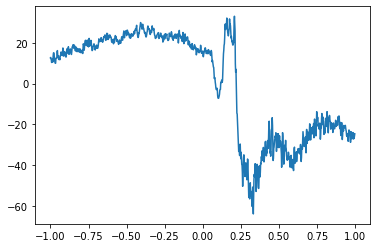

In [19]:
plt.plot(np.arange(-1, 1, 0.002), np.mean(trial_wise_channel, axis=0))
